# Apartat B

## 1. EDA (Exploratory Data Analysis)

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import scipy
import sklearn.model_selection
import sklearn.preprocessing
import sklearn.linear_model
from sklearn.covariance import EllipticEnvelope
from sklearn.ensemble import IsolationForest
from statistics import mean

# Visualitzarem 4 decimals per mostra
pd.set_option('display.float_format', lambda x: '%.4f' % x)


dataset0 = pd.read_csv("0.csv", header=0, delimiter=',', decimal=".", names=["1.1","1.2","1.3","1.4","1.5","1.6","1.7", "1.8", "2.1","2.2","2.3","2.4","2.5","2.6","2.7", "2.8","3.1","3.2","3.3","3.4","3.5","3.6","3.7", "3.8","4.1","4.2","4.3","4.4","4.5","4.6","4.7", "4.8","5.1","5.2","5.3","5.4","5.5","5.6","5.7", "5.8","6.1","6.2","6.3","6.4","6.5","6.6","6.7", "6.8","7.1","7.2","7.3","7.4","7.5","7.6","7.7", "7.8","8.1","8.2","8.3","8.4","8.5","8.6","8.7", "8.8", "GESTO"])
dataset1 = pd.read_csv("1.csv", header=0, delimiter=',', decimal=".", names=["1.1","1.2","1.3","1.4","1.5","1.6","1.7", "1.8", "2.1","2.2","2.3","2.4","2.5","2.6","2.7", "2.8","3.1","3.2","3.3","3.4","3.5","3.6","3.7", "3.8","4.1","4.2","4.3","4.4","4.5","4.6","4.7", "4.8","5.1","5.2","5.3","5.4","5.5","5.6","5.7", "5.8","6.1","6.2","6.3","6.4","6.5","6.6","6.7", "6.8","7.1","7.2","7.3","7.4","7.5","7.6","7.7", "7.8","8.1","8.2","8.3","8.4","8.5","8.6","8.7", "8.8", "GESTO"])
dataset2 = pd.read_csv("2.csv", header=0, delimiter=',', decimal=".", names=["1.1","1.2","1.3","1.4","1.5","1.6","1.7", "1.8", "2.1","2.2","2.3","2.4","2.5","2.6","2.7", "2.8","3.1","3.2","3.3","3.4","3.5","3.6","3.7", "3.8","4.1","4.2","4.3","4.4","4.5","4.6","4.7", "4.8","5.1","5.2","5.3","5.4","5.5","5.6","5.7", "5.8","6.1","6.2","6.3","6.4","6.5","6.6","6.7", "6.8","7.1","7.2","7.3","7.4","7.5","7.6","7.7", "7.8","8.1","8.2","8.3","8.4","8.5","8.6","8.7", "8.8", "GESTO"])
dataset3 = pd.read_csv("3.csv", header=0, delimiter=',', decimal=".", names=["1.1","1.2","1.3","1.4","1.5","1.6","1.7", "1.8", "2.1","2.2","2.3","2.4","2.5","2.6","2.7", "2.8","3.1","3.2","3.3","3.4","3.5","3.6","3.7", "3.8","4.1","4.2","4.3","4.4","4.5","4.6","4.7", "4.8","5.1","5.2","5.3","5.4","5.5","5.6","5.7", "5.8","6.1","6.2","6.3","6.4","6.5","6.6","6.7", "6.8","7.1","7.2","7.3","7.4","7.5","7.6","7.7", "7.8","8.1","8.2","8.3","8.4","8.5","8.6","8.7", "8.8", "GESTO"])

dataset = pd.concat([dataset0, dataset1])
dataset = pd.concat([dataset, dataset2])
dataset = pd.concat([dataset, dataset3])
dataset = dataset.reset_index()

data = dataset.values
x = data[:, :-1]
y = data[:, -1]

print("Dimensionalitat de la BBDD:", dataset.shape)
print("Dimensionalitat de les entrades X", x.shape)
print("Dimensionalitat de l'atribut Y", y.shape)

Dimensionalitat de la BBDD: (11674, 66)
Dimensionalitat de les entrades X (11674, 65)
Dimensionalitat de l'atribut Y (11674,)


In [3]:
dataset3.head()

,1.1,1.2,1.3,1.4,1.5,1.6,1.7,1.8,2.1,2.2,...,7.8,8.1,8.2,8.3,8.4,8.5,8.6,8.7,8.8,GESTO
0,-7.0000,0.0000,1.0000,0.0000,-13.0000,-18.0000,0.0000,-9.0000,-6.0000,-2.0000,...,-1.0000,11.0000,-4.0000,-5.0000,-4.0000,3.0000,-8.0000,-7.0000,-3.0000,3
1,-6.0000,-6.0000,-6.0000,-8.0000,25.0000,43.0000,-4.0000,7.0000,6.0000,1.0000,...,3.0000,2.0000,1.0000,3.0000,-1.0000,1.0000,9.0000,4.0000,4.0000,3
2,2.0000,1.0000,1.0000,1.0000,0.0000,-23.0000,2.0000,-6.0000,-1.0000,-2.0000,...,16.0000,-3.0000,-1.0000,-1.0000,-3.0000,0.0000,-3.0000,4.0000,3.0000,3
3,0.0000,3.0000,4.0000,5.0000,1.0000,25.0000,-9.0000,0.0000,0.0000,1.0000,...,1.0000,6.0000,2.0000,1.0000,-3.0000,-20.0000,-42.0000,-4.0000,2.0000,3
4,-11.0000,-2.0000,-5.0000,1.0000,-7.0000,-11.0000,-4.0000,-23.0000,-9.0000,0.0000,...,-4.0000,9.0000,1.0000,2.0000,8.0000,21.0000,41.0000,15.0000,9.0000,3


In [4]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11674 entries, 0 to 11673
Data columns (total 66 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   index   11674 non-null  int64  
 1   1.1     11674 non-null  float64
 2   1.2     11674 non-null  float64
 3   1.3     11674 non-null  float64
 4   1.4     11674 non-null  float64
 5   1.5     11674 non-null  float64
 6   1.6     11674 non-null  float64
 7   1.7     11674 non-null  float64
 8   1.8     11674 non-null  float64
 9   2.1     11674 non-null  float64
 10  2.2     11674 non-null  float64
 11  2.3     11674 non-null  float64
 12  2.4     11674 non-null  float64
 13  2.5     11674 non-null  float64
 14  2.6     11674 non-null  float64
 15  2.7     11674 non-null  float64
 16  2.8     11674 non-null  float64
 17  3.1     11674 non-null  float64
 18  3.2     11674 non-null  float64
 19  3.3     11674 non-null  float64
 20  3.4     11674 non-null  float64
 21  3.5     11674 non-null  float64
 22

In [5]:
dataset.head()

,index,1.1,1.2,1.3,1.4,1.5,1.6,1.7,1.8,2.1,...,7.8,8.1,8.2,8.3,8.4,8.5,8.6,8.7,8.8,GESTO
0,0,-47.0000,-6.0000,-5.0000,-7.0000,13.0000,-1.0000,35.0000,-10.0000,10.0000,...,-25.0000,47.0000,6.0000,6.0000,5.0000,13.0000,21.0000,111.0000,15.0000,0
1,1,-19.0000,-8.0000,-8.0000,-8.0000,-21.0000,-6.0000,-79.0000,12.0000,0.0000,...,-83.0000,7.0000,7.0000,1.0000,-8.0000,7.0000,21.0000,114.0000,48.0000,0
2,2,2.0000,3.0000,0.0000,2.0000,0.0000,22.0000,106.0000,-14.0000,-16.0000,...,-38.0000,-11.0000,4.0000,7.0000,11.0000,33.0000,39.0000,119.0000,43.0000,0
3,3,6.0000,0.0000,0.0000,-2.0000,-14.0000,10.0000,-51.0000,5.0000,7.0000,...,38.0000,-35.0000,-8.0000,2.0000,6.0000,-13.0000,-24.0000,-112.0000,-69.0000,0
4,4,15.0000,-5.0000,-5.0000,-15.0000,12.0000,-22.0000,-38.0000,36.0000,9.0000,...,-26.0000,5.0000,6.0000,6.0000,11.0000,5.0000,30.0000,-48.0000,25.0000,0


In [6]:
dataset.describe()

,index,1.1,1.2,1.3,1.4,1.5,1.6,1.7,1.8,2.1,...,7.8,8.1,8.2,8.3,8.4,8.5,8.6,8.7,8.8,GESTO
count,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,...,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000
mean,1458.7894,-0.5206,-0.7282,-0.7384,-0.7300,-0.1598,-0.5523,-1.2630,-0.6550,-0.6657,...,-0.9310,-0.8396,-0.7403,-0.7687,-0.7057,-0.1483,-0.3780,-1.4438,-0.6093,1.5033
std,842.6029,18.5671,11.7671,4.9897,7.4423,17.8521,25.8103,25.0744,15.3982,18.1266,...,15.1589,18.1977,12.0071,4.9697,7.3853,17.8419,25.5540,25.2584,15.5316,1.1175
min,0.0000,-116.0000,-104.0000,-33.0000,-75.0000,-121.0000,-122.0000,-128.0000,-128.0000,-110.0000,...,-128.0000,-116.0000,-128.0000,-46.0000,-74.0000,-103.0000,-128.0000,-128.0000,-124.0000,0.0000
25%,729.0000,-9.0000,-4.0000,-3.0000,-4.0000,-10.0000,-15.0000,-6.0000,-8.0000,-9.0000,...,-8.0000,-9.0000,-4.0000,-3.0000,-4.0000,-10.0000,-14.0000,-6.0000,-8.0000,1.0000
50%,1459.0000,-1.0000,-1.0000,-1.0000,-1.0000,0.0000,-1.0000,-1.0000,-1.0000,-1.0000,...,-1.0000,-1.0000,-1.0000,-1.0000,-1.0000,0.0000,-1.0000,-1.0000,-1.0000,2.0000
75%,2188.0000,7.0000,3.0000,2.0000,3.0000,10.0000,13.0000,4.0000,6.0000,6.0000,...,6.0000,6.0000,3.0000,2.0000,3.0000,10.0000,13.0000,3.0000,6.0000,3.0000
max,2941.0000,111.0000,90.0000,34.0000,55.0000,92.0000,127.0000,127.0000,126.0000,127.0000,...,114.0000,127.0000,105.0000,29.0000,51.0000,110.0000,127.0000,127.0000,127.0000,3.0000


### Heatmaps

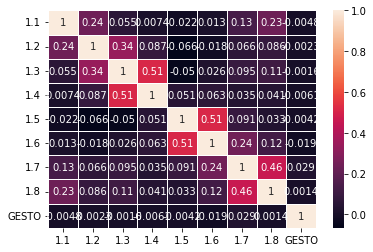

In [7]:
dataset1 = dataset[["1.1","1.2","1.3","1.4","1.5","1.6","1.7", "1.8", "GESTO"]].copy()
dataset2 = dataset[["2.1","2.2","2.3","2.4","2.5","2.6","2.7", "2.8", "GESTO"]].copy()
dataset3 = dataset[["3.1","3.2","3.3","3.4","3.5","3.6","3.7", "3.8", "GESTO"]].copy()
dataset4 = dataset[["4.1","4.2","4.3","4.4","4.5","4.6","4.7", "4.8", "GESTO"]].copy()
dataset5 = dataset[["5.1","5.2","5.3","5.4","5.5","5.6","5.7", "5.8", "GESTO"]].copy()
dataset6 = dataset[["6.1","6.2","6.3","6.4","6.5","6.6","6.7", "6.8", "GESTO"]].copy()
dataset7 = dataset[["7.1","7.2","7.3","7.4","7.5","7.6","7.7", "7.8", "GESTO"]].copy()
dataset8 = dataset[["8.1","8.2","8.3","8.4","8.5","8.6","8.7", "8.8", "GESTO"]].copy()
co1 = dataset1.corr()
co2 = dataset2.corr()
co3 = dataset3.corr()
co4 = dataset4.corr()
co5 = dataset5.corr()
co6 = dataset6.corr()
co7 = dataset7.corr()
co8 = dataset8.corr()

plt.figure()

ax1 = sns.heatmap(co1, annot=True, linewidths=.5)

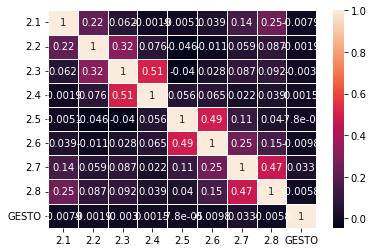

In [8]:
ax2 = sns.heatmap(co2, annot=True, linewidths=.5)

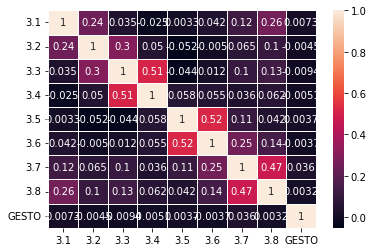

In [9]:
ax3 = sns.heatmap(co3, annot=True, linewidths=.5)

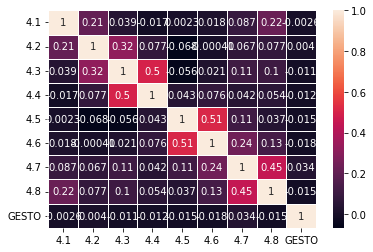

In [10]:
ax4 = sns.heatmap(co4, annot=True, linewidths=.5)

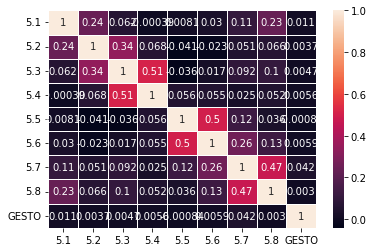

In [11]:
ax5 = sns.heatmap(co5, annot=True, linewidths=.5)

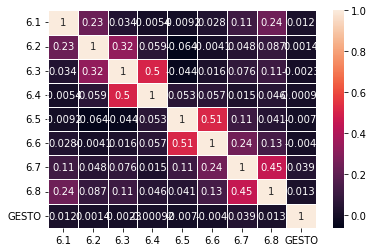

In [12]:
ax6 = sns.heatmap(co6, annot=True, linewidths=.5)

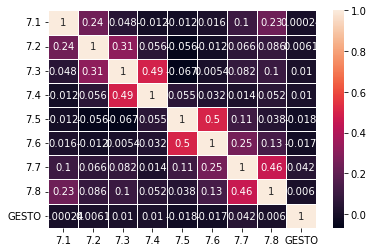

In [13]:
ax7 = sns.heatmap(co7, annot=True, linewidths=.5)

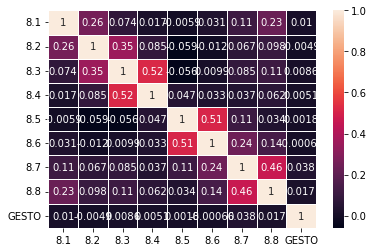

In [14]:
ax8 = sns.heatmap(co8, annot=True, linewidths=.5)

### Histogrames i pairplots

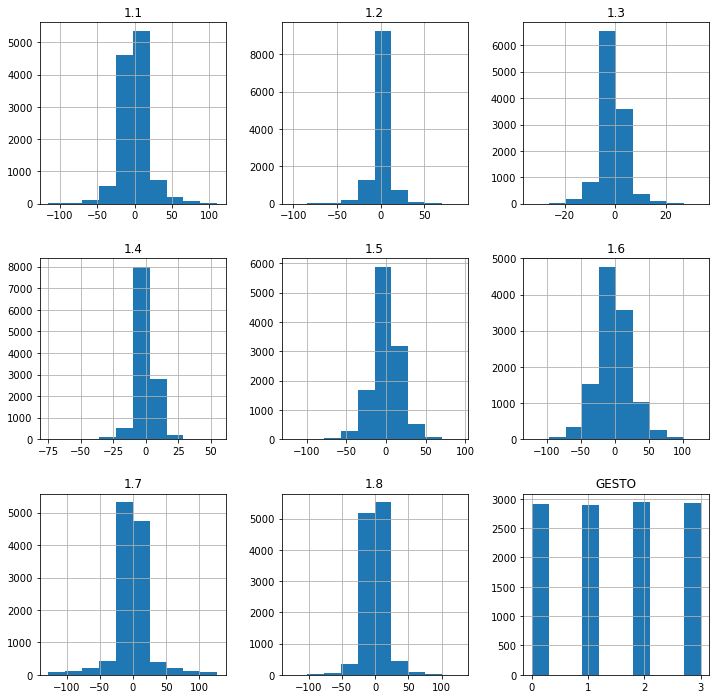

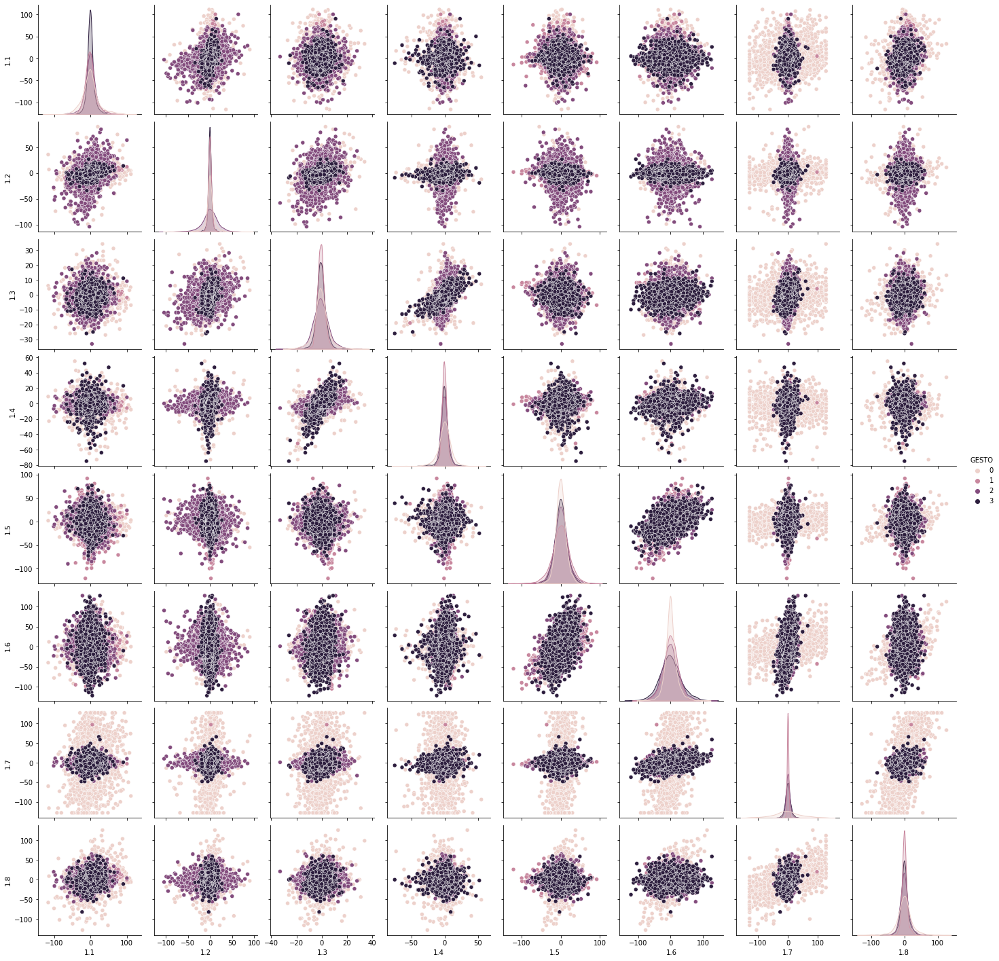

In [15]:
dataset1.hist(figsize=(12, 12))
rel1 = sns.pairplot(dataset1, hue='GESTO')

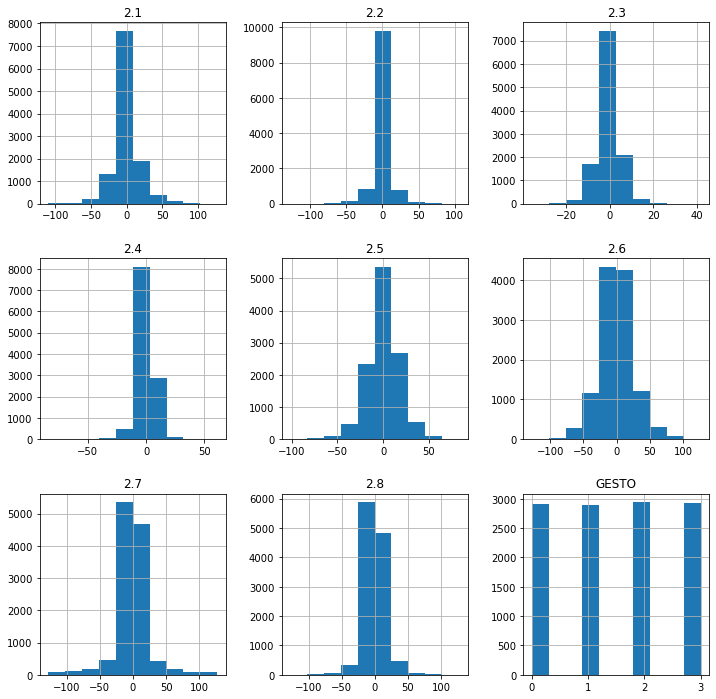

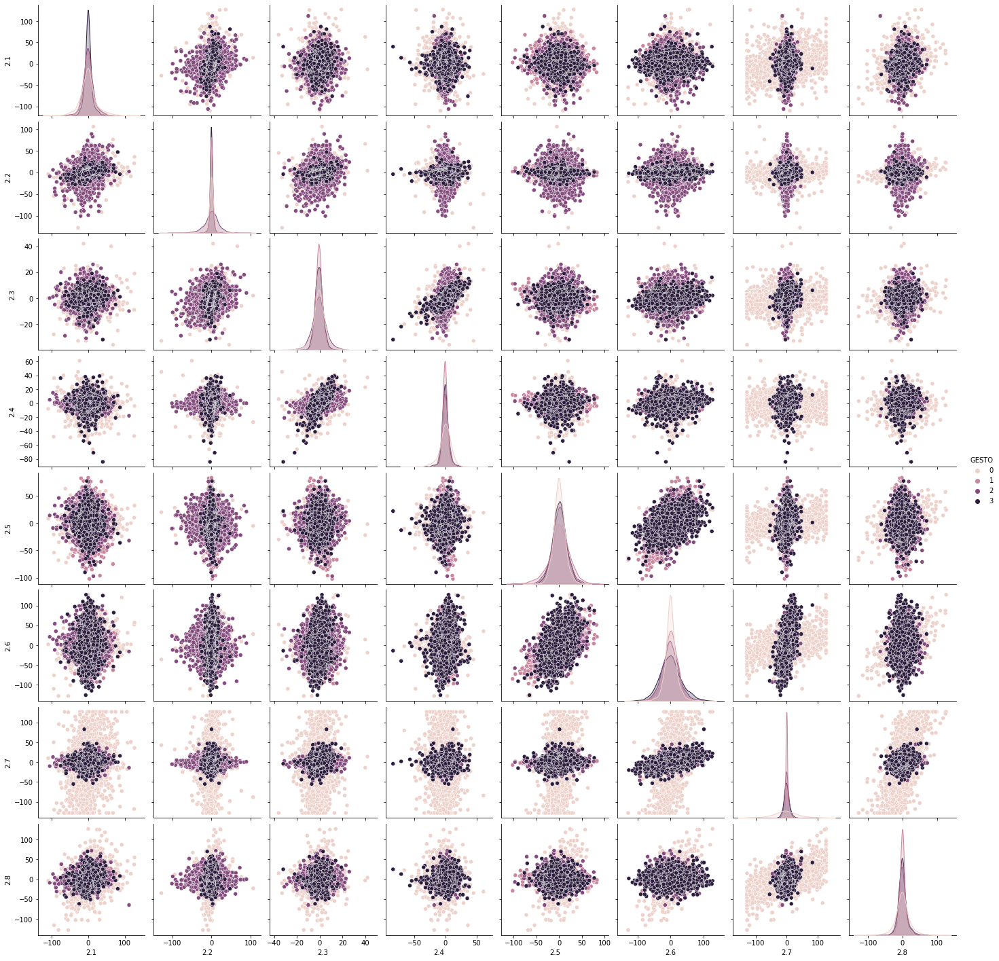

In [16]:
dataset2.hist(figsize=(12, 12))
rel2 = sns.pairplot(dataset2, hue='GESTO')

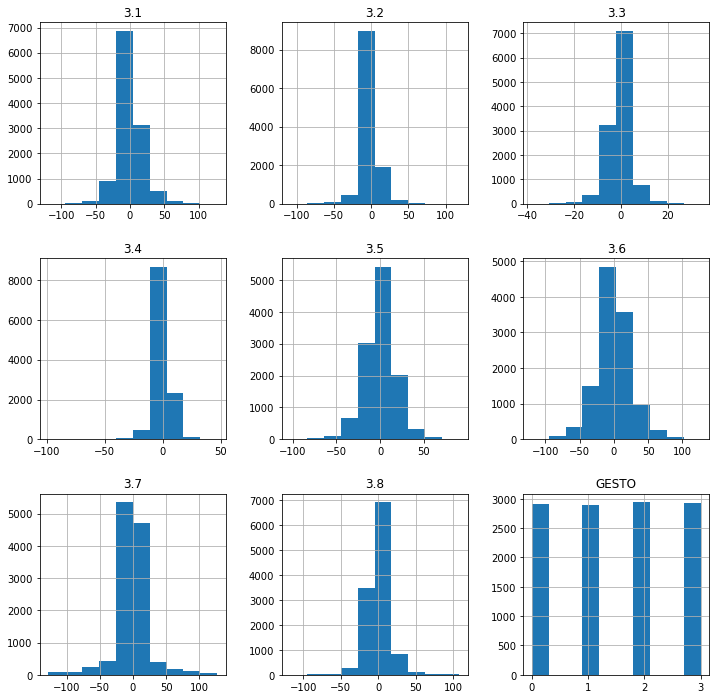

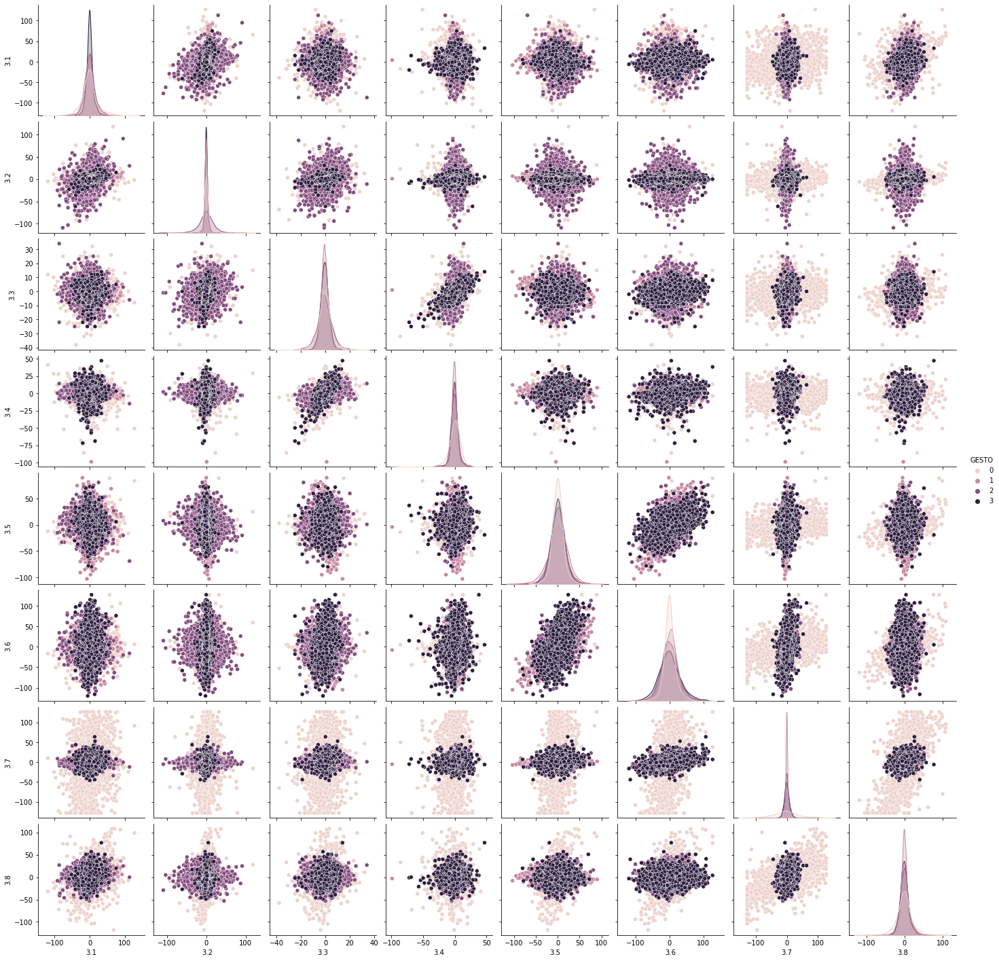

In [17]:
dataset3.hist(figsize=(12, 12))
rel3 = sns.pairplot(dataset3, hue='GESTO')

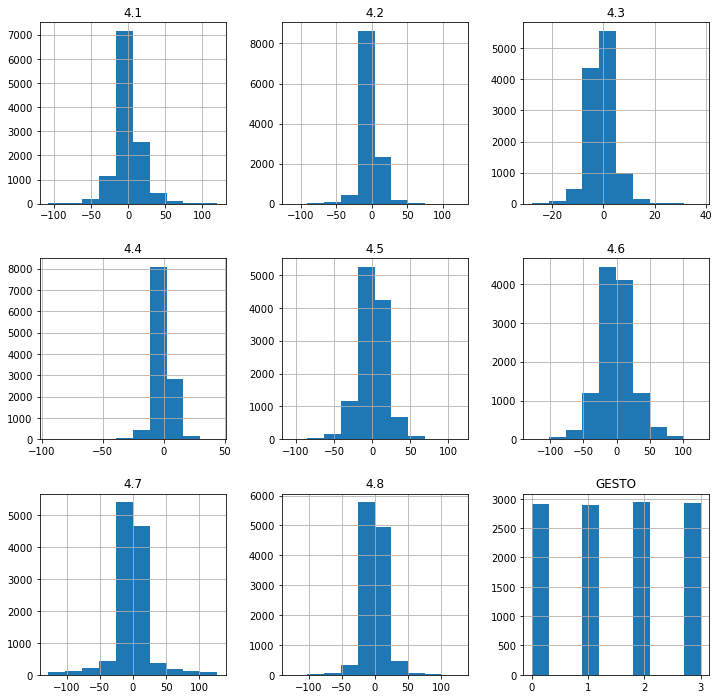

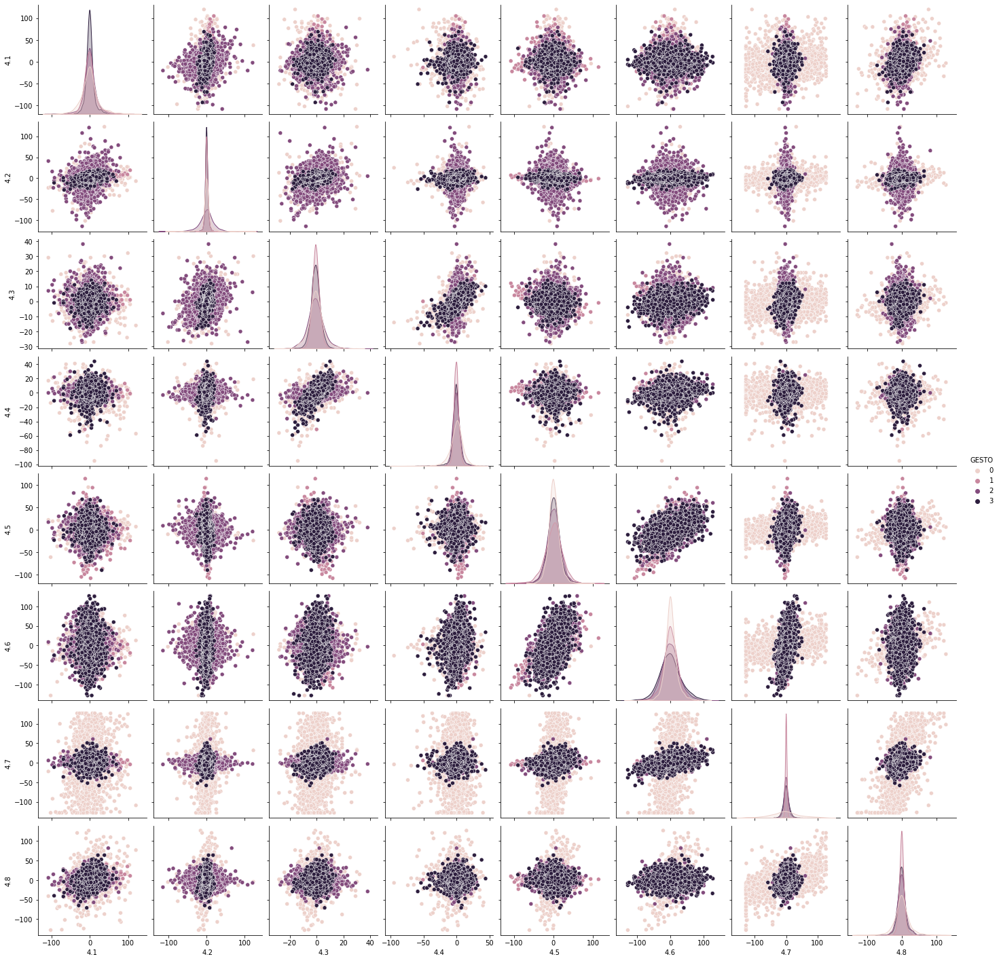

In [18]:
dataset4.hist(figsize=(12, 12))
rel4 = sns.pairplot(dataset4, hue='GESTO')

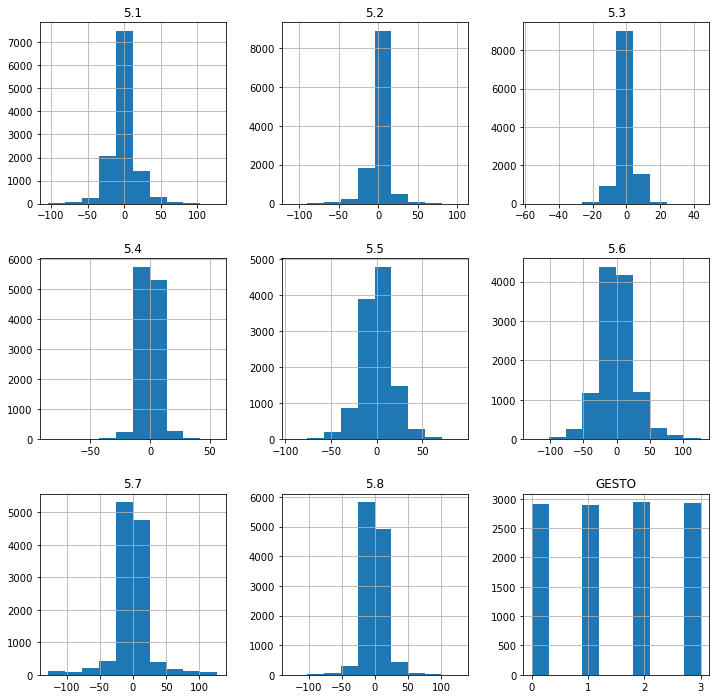

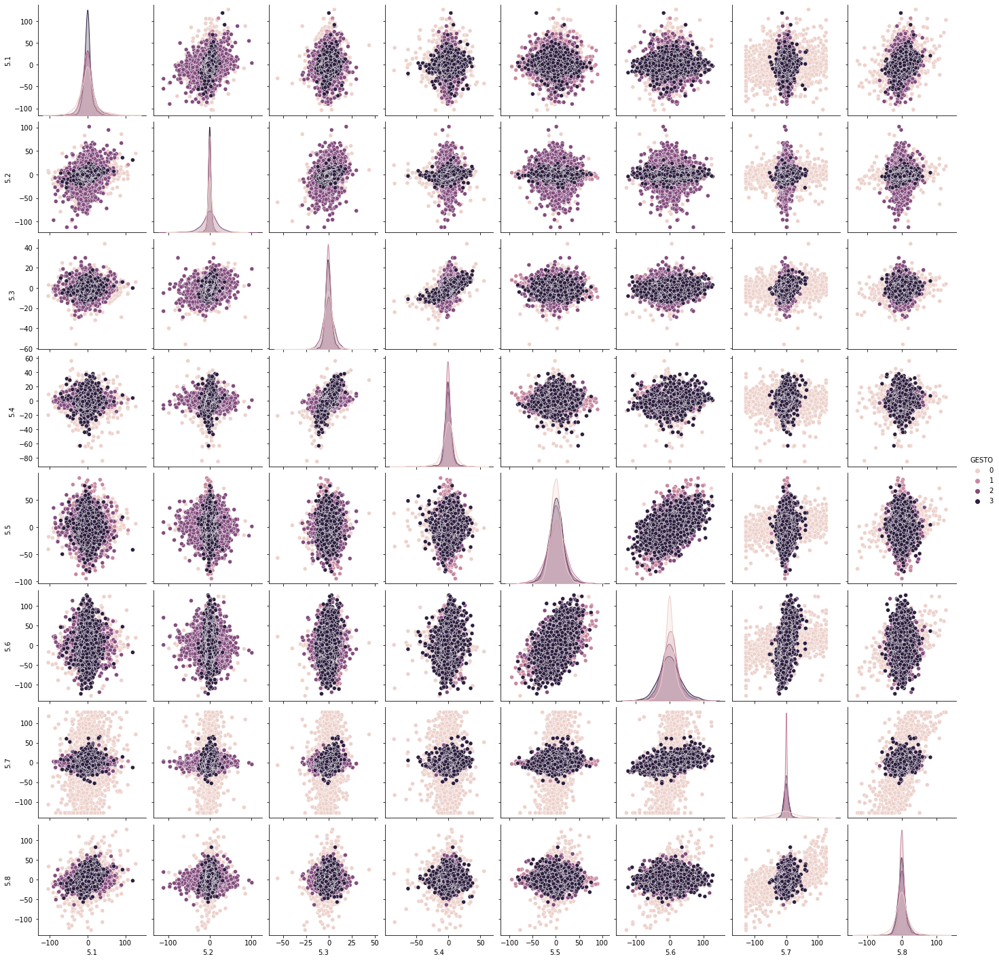

In [19]:
dataset5.hist(figsize=(12, 12))
rel5 = sns.pairplot(dataset5, hue='GESTO')

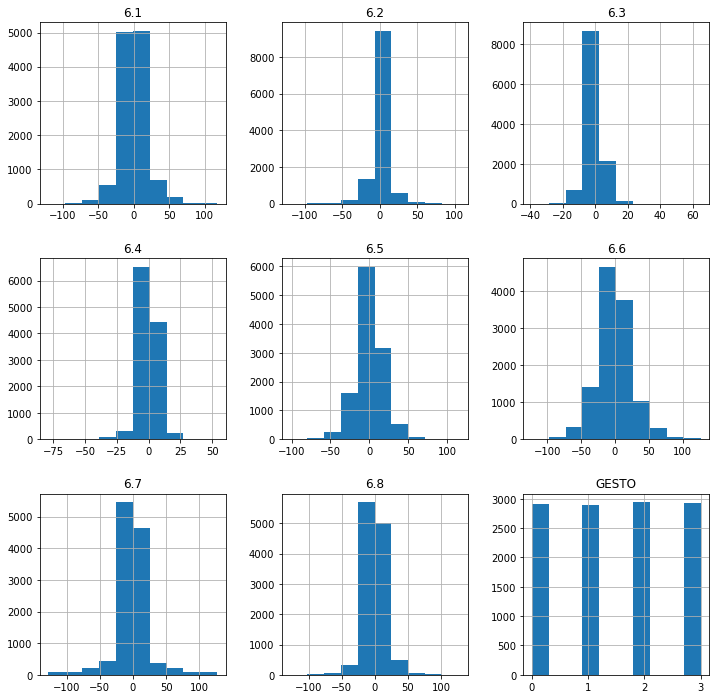

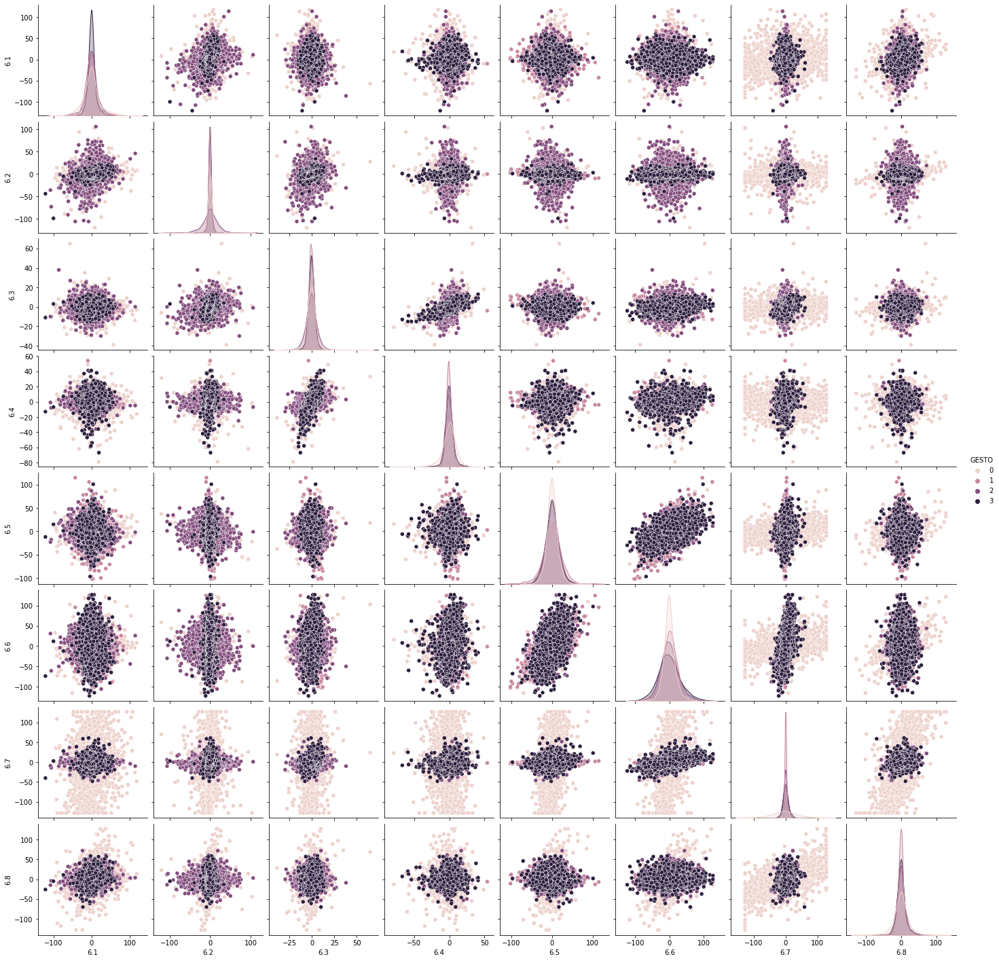

In [20]:
dataset6.hist(figsize=(12, 12))
rel6 = sns.pairplot(dataset6, hue='GESTO')

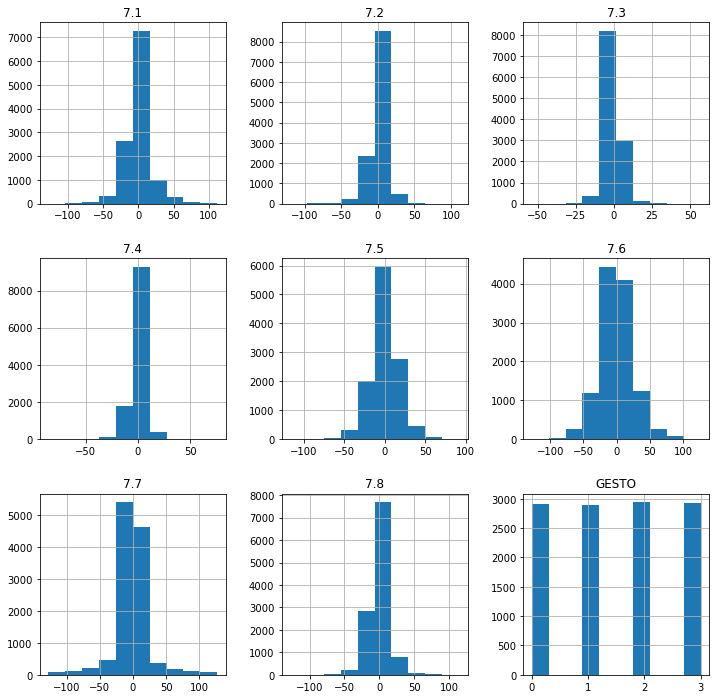

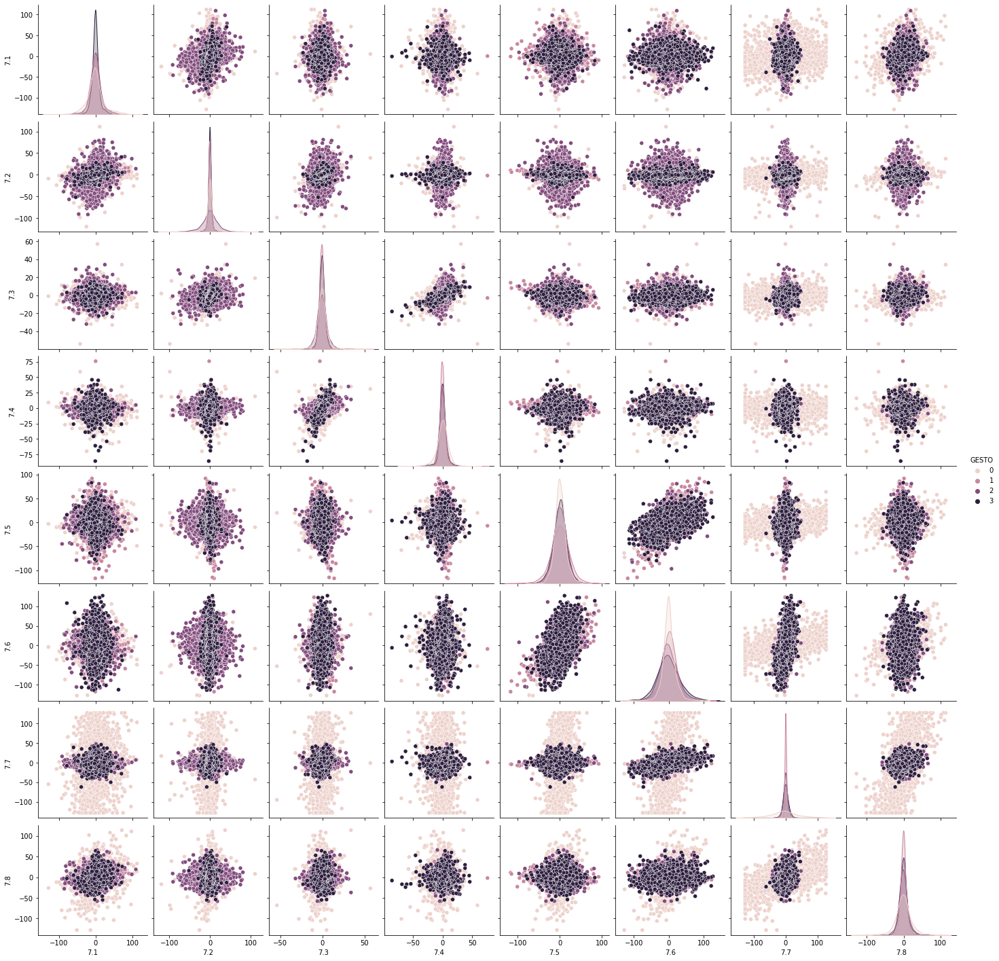

In [21]:
dataset7.hist(figsize=(12, 12))
rel7 = sns.pairplot(dataset7, hue='GESTO')

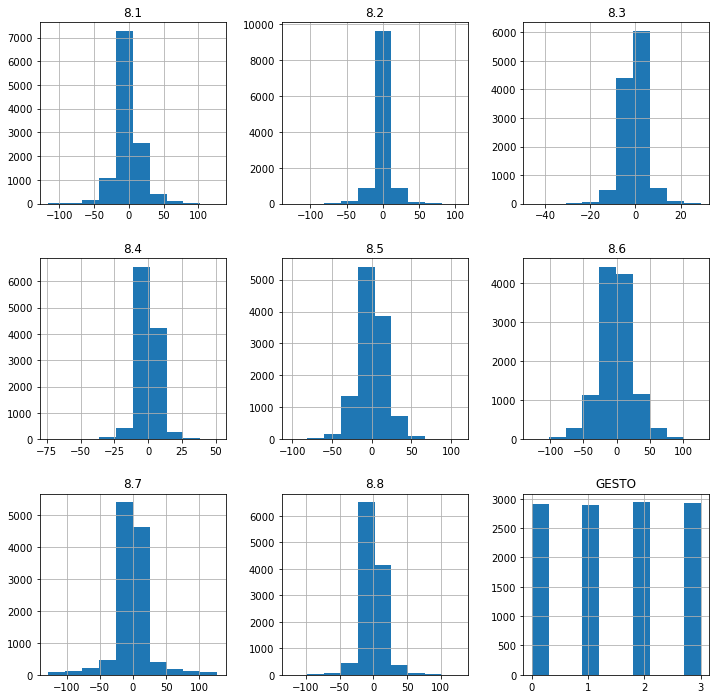

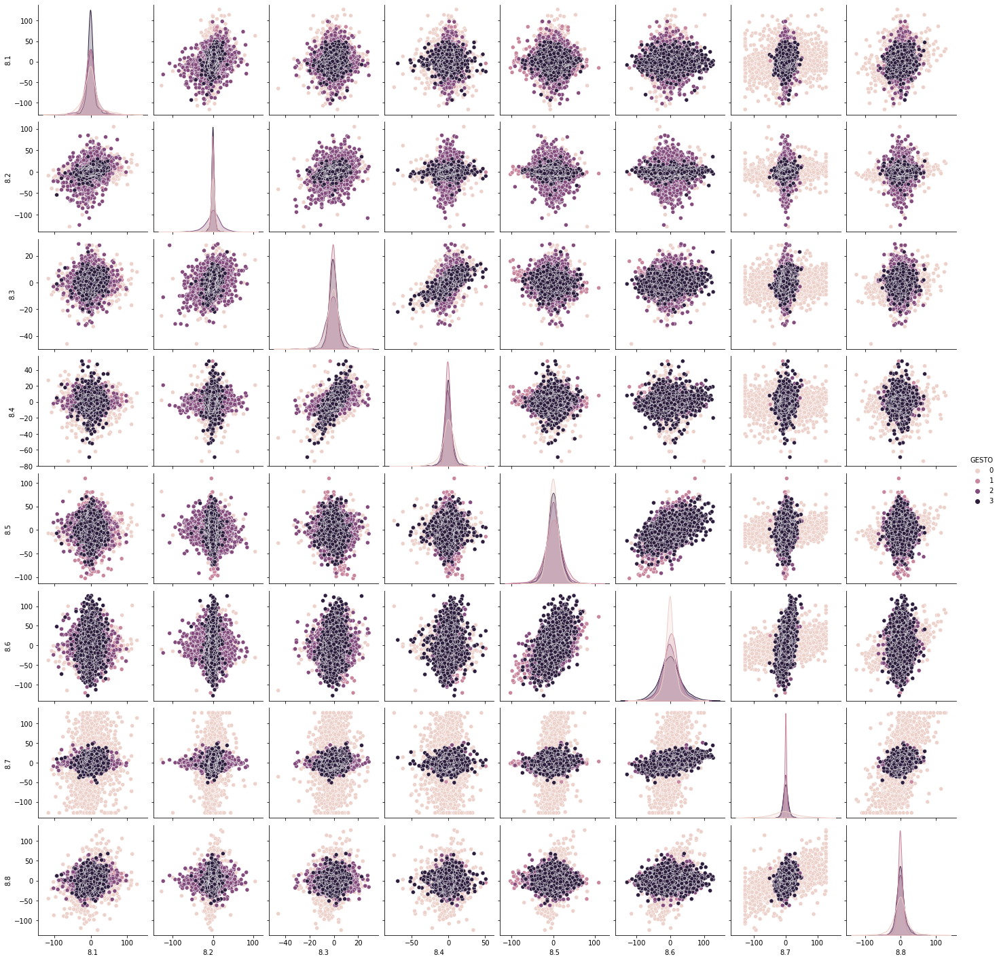

In [22]:
dataset8.hist(figsize=(12, 12))
rel8 = sns.pairplot(dataset8, hue='GESTO')

## 2. Preprocessing (normalization, outlier removal, feature selection..)

### Normalization

Declarem tots els tipus de normalització que volem provar

In [23]:

x = x.astype(float)
y = y.astype(float)
minmax = sklearn.preprocessing.MinMaxScaler()
x_minmax = minmax.fit_transform(x)

standard = sklearn.preprocessing.StandardScaler()
x_standard = standard.fit_transform(x)

robust = sklearn.preprocessing.RobustScaler()
x_robust = robust.fit_transform(x)

yeoJohnson = sklearn.preprocessing.PowerTransformer()
x_yeoJohnson = yeoJohnson.fit_transform(x)

Els provem tots amb stratified k-fold i amb logistic regression, per veure els resultats de cadascún i escollir un tipus de normalitzacio a partir d'aquests resultats.

In [24]:
logisticReg = sklearn.linear_model.LogisticRegression()

skf = sklearn.model_selection.StratifiedKFold(n_splits=5, shuffle=True)
accuracy_sense = []
accuracy_minmax = []
accuracy_standard = []
accuracy_robust = []
accuracy_yeoJohnson = []


#DE MOMENTO LAS COMENTO PORQ CON ESAS DOS ME DICE QUE LO TENGO QUE ESTANDARIZAR PORQ SE PASAN DEL NUMERO MAXIMO DE ITERACIONES
'''
#Sense normalització

for train_index, test_index in skf.split(x, y):
    x_train, x_test = x[train_index], x[test_index]
    y_train, y_test = y[train_index], y[test_index]
    logisticReg.fit(x_train, y_train)
    accuracy_sense.append(logisticReg.score(x_test, y_test))

print('\nSense Scaler:')
print('List of possible accuracy:', accuracy_sense)
print('\nMaximum Accuracy That can be obtained from this model is:',
      max(accuracy_sense)*100, '%')
print('\nMinimum Accuracy:',
      min(accuracy_sense)*100, '%')
print('\nOverall Accuracy:',
      mean(accuracy_sense)*100, '%')

#MinMax

for train_index, test_index in skf.split(x_minmax, y):
    x_train, x_test = x_minmax[train_index], x_minmax[test_index]
    y_train, y_test = y[train_index], y[test_index]
    logisticReg.fit(x_train, y_train)
    accuracy_minmax.append(logisticReg.score(x_test, y_test))

print('\nMinMax Scaler')
print('List of possible accuracy:', accuracy_minmax)
print('\nMaximum Accuracy That can be obtained from this model is:',
      max(accuracy_minmax)*100, '%')
print('\nMinimum Accuracy:',
      min(accuracy_minmax)*100, '%')
print('\nOverall Accuracy:',
      mean(accuracy_minmax)*100, '%')
'''

#Standard_Scaler

for train_index, test_index in skf.split(x_standard, y):
    x_train, x_test = x_standard[train_index], x_standard[test_index]
    y_train, y_test = y[train_index], y[test_index]
    logisticReg.fit(x_train, y_train)
    accuracy_standard.append(logisticReg.score(x_test, y_test))

print('\nStandard Scaler:')
print('List of possible accuracy:', accuracy_standard)
print('\nMaximum Accuracy That can be obtained from this model is:',
      max(accuracy_standard)*100, '%')
print('\nMinimum Accuracy:',
      min(accuracy_standard)*100, '%')
print('\nOverall Accuracy:',
      mean(accuracy_standard)*100, '%')

#Robust_Scaler

for train_index, test_index in skf.split(x_robust, y):
    x_train, x_test = x_robust[train_index], x_robust[test_index]
    y_train, y_test = y[train_index], y[test_index]
    logisticReg.fit(x_train, y_train)
    accuracy_robust.append(logisticReg.score(x_test, y_test))

print('\nRobust Scaler:')
print('List of possible accuracy:', accuracy_robust)
print('\nMaximum Accuracy That can be obtained from this model is:',
      max(accuracy_robust)*100, '%')
print('\nMinimum Accuracy:',
      min(accuracy_robust)*100, '%')
print('\nOverall Accuracy:',
      mean(accuracy_robust)*100, '%')

#Yeo-Johson

for train_index, test_index in skf.split(x_yeoJohnson, y):
    x_train, x_test = x_yeoJohnson[train_index], x_yeoJohnson[test_index]
    y_train, y_test = y[train_index], y[test_index]
    logisticReg.fit(x_train, y_train)
    accuracy_yeoJohnson.append(logisticReg.score(x_test, y_test))

print('\nYeo-Johnson Scaler:')
print('List of possible accuracy:', accuracy_yeoJohnson)
print('\nMaximum Accuracy That can be obtained from this model is:',
      max(accuracy_yeoJohnson)*100, '%')
print('\nMinimum Accuracy:',
      min(accuracy_yeoJohnson)*100, '%')
print('\nOverall Accuracy:',
      mean(accuracy_yeoJohnson)*100, '%')


Standard Scaler:
List of possible accuracy: [0.3537473233404711, 0.35460385438972164, 0.3486081370449679, 0.3430406852248394, 0.32562125107112255]

Maximum Accuracy That can be obtained from this model is: 35.46038543897217 %

Minimum Accuracy: 32.56212510711226 %

Overall Accuracy: 34.51242502142245 %

Robust Scaler:
List of possible accuracy: [0.34518201284796574, 0.35160599571734474, 0.3443254817987152, 0.34346895074946465, 0.33718937446443875]

Maximum Accuracy That can be obtained from this model is: 35.16059957173447 %

Minimum Accuracy: 33.718937446443874 %

Overall Accuracy: 34.43543631155858 %

Yeo-Johnson Scaler:
List of possible accuracy: [0.3747323340471092, 0.3734475374732334, 0.36488222698072803, 0.3845824411134904, 0.397172236503856]

Maximum Accuracy That can be obtained from this model is: 39.717223650385606 %

Minimum Accuracy: 36.4882226980728 %

Overall Accuracy: 37.89633552236834 %


El scaler que ens ha donat millor resultat es el Yeo-Johnson, per lo tant és el que utilitzarem d'aqui endavant.

### Outlier Removal

In [25]:
isoForest = IsolationForest()
outliers = isoForest.fit_predict(x_train)
x_trainOut = x_train[outliers == 1]
y_trainOut = y_train[outliers == 1]
print(x_train.shape)
print(x_trainOut.shape)

x_train = x_trainOut
y_train = y_trainOut
#ENCONTRAR FORMA DE VISUALIZAR LA DIFERENCIA ENTRE CUANDO TENIA OUTLIERS I CUANDO NO



(9340, 65)
(9203, 65)


### PCA

PCA_1 - MSE: 2.014; R2: -0.614; R2 K-Fold: -0.530
PCA_2 - MSE: 1.716; R2: -0.375; R2 K-Fold: -0.616
PCA_3 - MSE: 1.844; R2: -0.477; R2 K-Fold: -0.755
PCA_4 - MSE: 1.752; R2: -0.404; R2 K-Fold: -0.626
PCA_5 - MSE: 1.752; R2: -0.403; R2 K-Fold: -0.646
PCA_6 - MSE: 2.124; R2: -0.702; R2 K-Fold: -0.747
PCA_7 - MSE: 2.093; R2: -0.677; R2 K-Fold: -0.703
PCA_8 - MSE: 2.200; R2: -0.762; R2 K-Fold: -0.768
PCA_9 - MSE: 2.184; R2: -0.749; R2 K-Fold: -0.780
PCA_10 - MSE: 2.229; R2: -0.786; R2 K-Fold: -0.773
PCA_11 - MSE: 2.146; R2: -0.719; R2 K-Fold: -0.761
PCA_12 - MSE: 2.185; R2: -0.750; R2 K-Fold: -0.775
PCA_13 - MSE: 2.226; R2: -0.783; R2 K-Fold: -0.760
PCA_14 - MSE: 2.162; R2: -0.732; R2 K-Fold: -0.741
PCA_15 - MSE: 2.184; R2: -0.749; R2 K-Fold: -0.780
PCA_16 - MSE: 2.188; R2: -0.753; R2 K-Fold: -0.779
PCA_17 - MSE: 2.180; R2: -0.747; R2 K-Fold: -0.780
PCA_18 - MSE: 2.206; R2: -0.767; R2 K-Fold: -0.780
PCA_19 - MSE: 2.206; R2: -0.767; R2 K-Fold: -0.762
PCA_20 - MSE: 2.204; R2: -0.765; R2 K-Fo

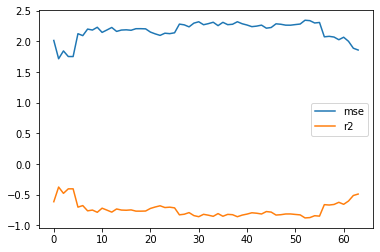

In [34]:
from sklearn.decomposition import PCA
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
import sklearn.svm

#classifier = RandomForestClassifier(max_depth=2, random_state=0)
classifier = sklearn.linear_model.LogisticRegression()
#classifier = sklearn.svm.SVC()

pca = PCA(n_components=1)
X_train = pca.fit_transform(x_train)
X_test = pca.transform(x_test)


mses, r2s = [], []
for i in range(1, x_train.shape[1]):
    pca = PCA(n_components=i)
    x_train_transformed = pca.fit_transform(x_train)
    x_test_transformed = pca.transform(x_test)

    
    classifier.fit(x_train_transformed, y_train)
    preds = classifier.predict(x_test_transformed)

    mse = mean_squared_error(y_test, preds)
    r2 = r2_score(y_test, preds)
    kfold_score = cross_val_score(classifier, x_train_transformed, y_train, scoring='r2', cv=5).mean()
    print(f"PCA_{i} - MSE: {mse:.3f}; R2: {r2:.3f}; R2 K-Fold: {kfold_score:.3f}")
    
    mses.append(mse)
    r2s.append(r2)
    
plt.plot(mses, label='mse')
plt.plot(r2s, label='r2')
plt.legend()
plt.show()


### Polynomial Features